# Lab 5.1 Fine-Tuning

In this notebook you will explore fine-tuning a CNN to classify pet breeds.

In [1]:
# device = 'cpu'
device = 'cuda' # set this if using GPU on Colab for example

Here is some code to download a prepared version of the [Oxford-IIIT Pet dataset](https://www.robots.ox.ac.uk/~vgg/data/pets/).

In [2]:
import os
if not os.path.exists('oxford_pets.zip'):
  !wget "https://www.dropbox.com/scl/fi/p49ifha27c2u3uptfj42w/oxford_pets_corrected.zip?rlkey=dwk3dsptzir8v846imsq6bgw3&dl=1" -O oxford_pets.zip
  !unzip -qq oxford_pets.zip

In [3]:
!pip install torchmetrics
import torch
import torch.nn as nn
import torchvision
import torchmetrics
import numpy as np
from matplotlib import pyplot as plt
from tqdm import tqdm

The following code sets up dataset and dataloaders for the data.  It creates two versions: the `no_transform` version does not apply any transformations, and the other one applies the appropriate transformations for the VGG16 model (resize, recropping, centering, and scaling).

In [4]:
transforms = torchvision.models.VGG16_Weights.IMAGENET1K_V1.transforms()

train_ds_no_transform = torchvision.datasets.ImageFolder(
    'oxford_pets/train',
)
train_ds = torchvision.datasets.ImageFolder(
    'oxford_pets/train',
    transform=transforms
)
train_loader = torch.utils.data.DataLoader(train_ds, batch_size=32, shuffle=True)
test_ds_no_transform = torchvision.datasets.ImageFolder(
    'oxford_pets/test',
)
test_ds = torchvision.datasets.ImageFolder(
    'oxford_pets/test',
    transform=transforms
)
test_loader = torch.utils.data.DataLoader(test_ds, batch_size=32, shuffle=False)

In [5]:
train_ds

Dataset ImageFolder
    Number of datapoints: 6639
    Root location: oxford_pets/train
    StandardTransform
Transform: ImageClassification(
               crop_size=[224]
               resize_size=[256]
               mean=[0.485, 0.456, 0.406]
               std=[0.229, 0.224, 0.225]
               interpolation=InterpolationMode.BILINEAR
           )

Text(0.5, 1.0, 'Abyssinian')

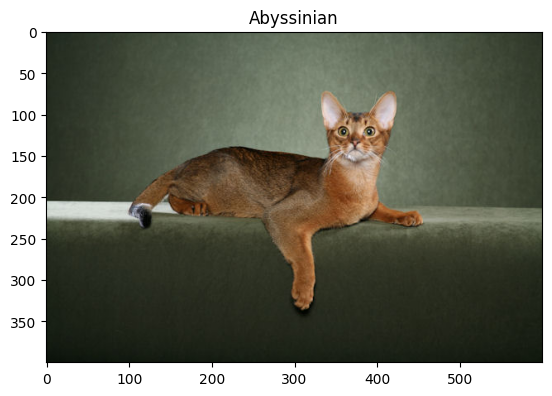

In [6]:
image,label = next(iter(train_ds_no_transform))
plt.imshow(image)
plt.title(train_ds.classes[label])

Now we will grab the VGG16 model with pretrained weights.

In [7]:
vgg16 = torchvision.models.vgg16(weights=torchvision.models.VGG16_Weights.IMAGENET1K_V1).to(device)

In [8]:
vgg16

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

### Exercises

1. Iterate through the parameters of the `features` part of VGG16 and set `requires_grad=False` on each paramter.

In [9]:
for parameter in vgg16.features.parameters():
    parameter.requires_grad = False

vgg16

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

2. Replace the `classifier` part of the network with a new `Sequential` model that has 35 outputs for the 35 pet breeds.

*Note:* You can do `vgg16.classifier = nn.Sequential(...).to(device)`.

In [10]:
vgg16.classifier = nn.Sequential(
    nn.Linear(in_features=25088, out_features=4096, bias=True),
    nn.ReLU(inplace=True),
    nn.Dropout(p=0.5, inplace=False),
    nn.Linear(in_features=4096, out_features=4096, bias=True),
    nn.ReLU(inplace=True),
    nn.Dropout(p=0.5, inplace=False),
    nn.Linear(in_features=4096, out_features=35, bias=True)
)
vgg16

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

3. Use the following code to check the test set accuracy of the model *before* training it.  Interpret the result.

In [11]:
metric = torchmetrics.Accuracy('multiclass',num_classes=35).to(device)
metric.reset()
vgg16.to(device)
for x_batch, y_batch in test_loader:
    y_pred = vgg16(x_batch.to(device))
    metric(y_pred, y_batch.to(device))
# metric.compute()

print(f"Test Accuracy before Training: {metric.compute().item() * 100:.2f}%")

Test Accuracy before Training: 3.25%


The accuracy before training is very low because it is randomly guessing based on the pretrained model. It was originally trained on a different dataset with different classes, so it is guessing blindly. After testing and fine-tuning, it will improve.

5. Now train the model on the training set for three epochs.

In [12]:
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(vgg16.parameters(), lr=0.001)

epochs = 3
for epoch in range(epochs):
    vgg16.train()
    running_loss = 0.0

    for images, labels in tqdm(train_loader):
        images, labels = images.to(device), labels.to(device)

        optimizer.zero_grad()

        outputs = vgg16(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

    print(f"Epoch {epoch + 1}/{epochs}, Loss: {running_loss / len(train_loader)}")

100%|██████████| 208/208 [01:21<00:00,  2.56it/s]


Epoch 1/3, Loss: 2.1177030612642946


100%|██████████| 208/208 [01:22<00:00,  2.51it/s]


Epoch 2/3, Loss: 1.7949181199073792


100%|██████████| 208/208 [01:22<00:00,  2.53it/s]

Epoch 3/3, Loss: 2.0486823675007773


6. Evaluate the accuracy of the fine-tuned model on the test set.

In [13]:
vgg16.eval()
metric = torchmetrics.Accuracy(task="multiclass", num_classes=35).to(device)
metric.reset()

for images, labels in test_loader:
    images, labels = images.to(device), labels.to(device)
    outputs = vgg16(images)
    metric(outputs, labels)

print(f"Test Accuracy: {metric.compute().item() * 100:.2f}%")

Test Accuracy: 81.46%


7. The following code will show some test images with the correct and predicted labels.

In [14]:
vgg16.eval()
preds = []
for x_batch, y_batch in test_loader:
    y_pred = vgg16(x_batch.to(device))
    y_pred = torch.argmax(y_pred,dim=-1)
    preds.append(y_pred.detach().cpu().numpy())
preds = np.concatenate(preds,axis=0)

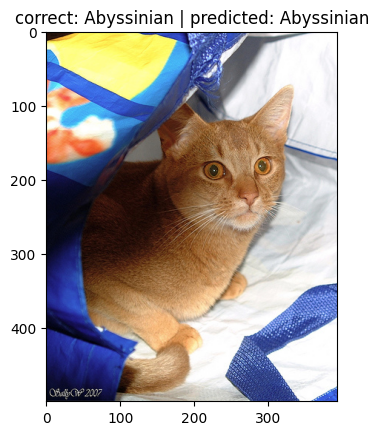

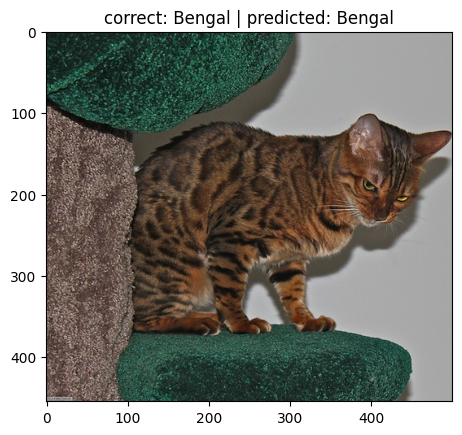

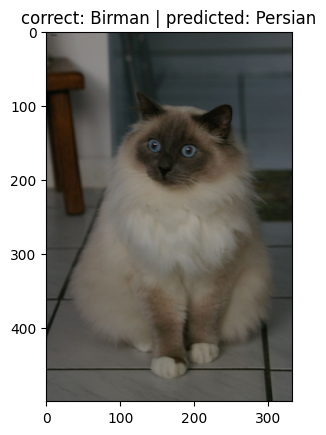

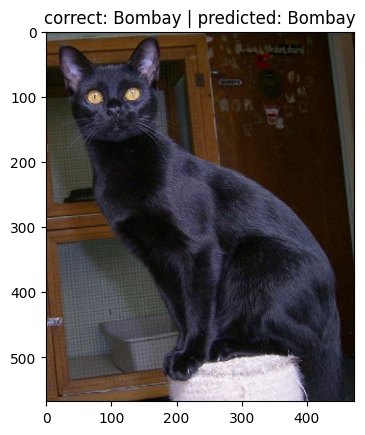

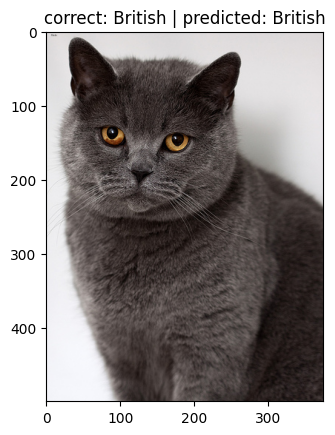

...

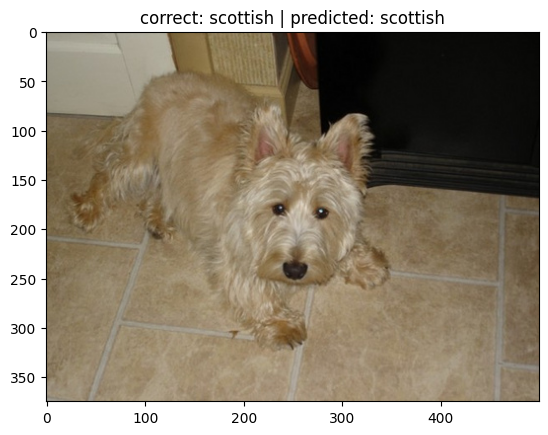

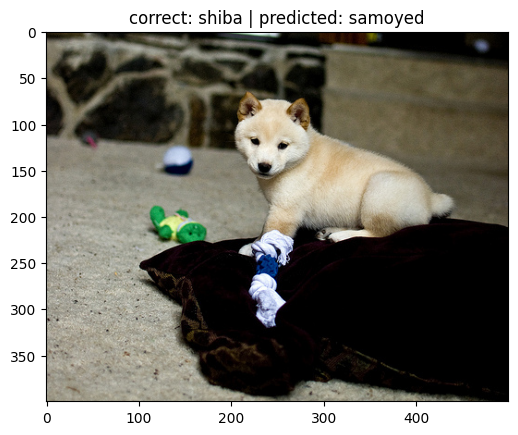

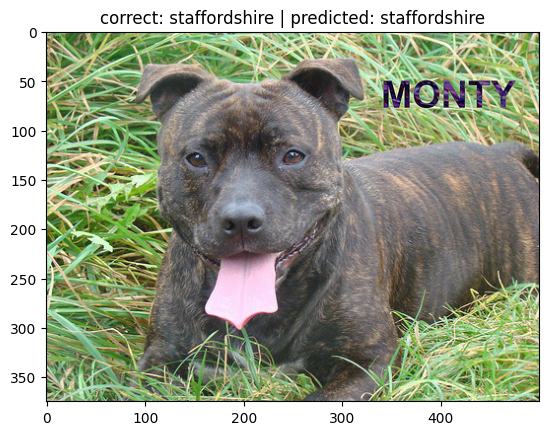

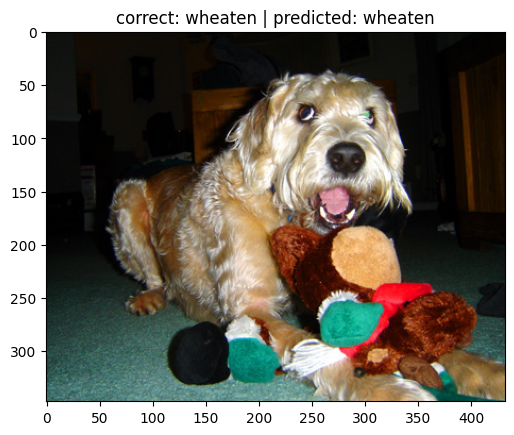

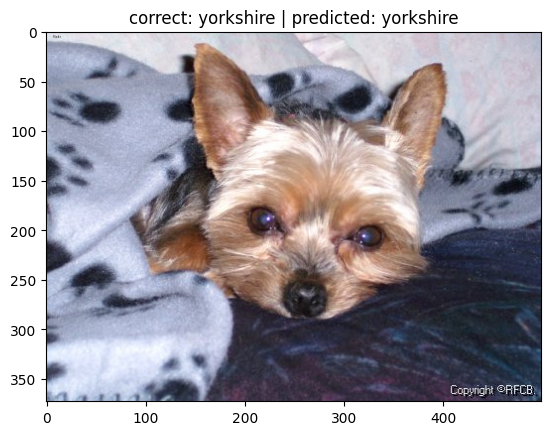

In [15]:
i = 0
for (im,label),pred in zip(test_ds_no_transform,preds):
  if i%20 == 0:
    plt.imshow(im)
    plt.title(f'correct: {test_ds.classes[label]} | predicted: {test_ds.classes[pred]}')
    plt.show()
  i += 1